# Assignment 3

*Dency Claris Thomas*

*Dataset 6*

(a) Generate graphs based on Watts-Strogatz Model, and each of them should have the same number
of nodes as Facebook-Ego. Please generate 9 graphs with three different values of ¯k and p. Please
plot the graph structures, degree distributions, and clustering coefficients as well.


In [1]:
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy as np

In [2]:
# Load facebood ego dataset to get the number of nodes
facebook_edges_file = 'datasets/1684.edges'
facebook_ego_graph = nx.read_edgelist(facebook_edges_file)

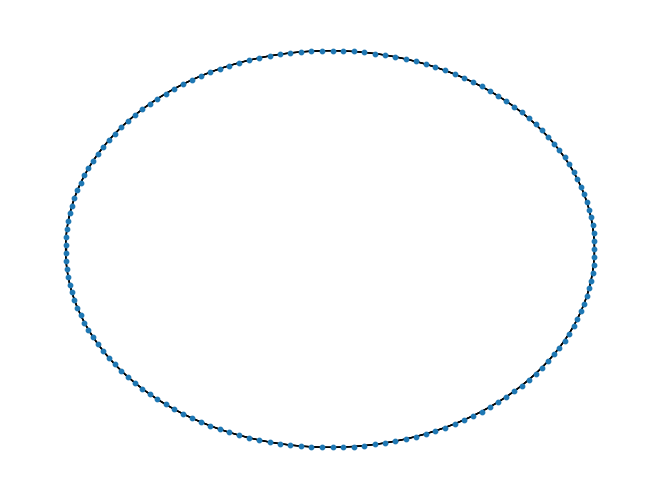

In [3]:
# Function to yeild the edges of the ring lattice
def ring_lattice_edges(nodes, k):
    half = k // 2
    n = len(nodes)
    for i, v in enumerate(nodes):
        for j in range(i+1, i+half+1):
            w = nodes[j % n]
            yield v, w

# Function to create the ring lattice           
def make_ring_lattice(graph,k):
    G = nx.Graph()
    nodes = range(graph.number_of_nodes())
    G.add_nodes_from(nodes)
    edges = ring_lattice_edges(nodes, k)
    G.add_edges_from(edges)
    return G

G = make_ring_lattice(facebook_ego_graph, 4)
nx.draw_circular(G, node_size=10)
plt.show()

# Function to rewire the edges
def rewire(G, p):
    for v, w in G.edges():
        if random.random() < p:
            G.remove_edge(v, w)
            choices = set(G) -{v} -set(G[v])
            new_w = random.choice(list(choices))
            G.add_edge(v, new_w)

# Function to generate the Watts Strongatz graph
def watts_strogatz_graph(graph,k,p):
    G = make_ring_lattice(graph, k)
    rewire(G, p)
    return G

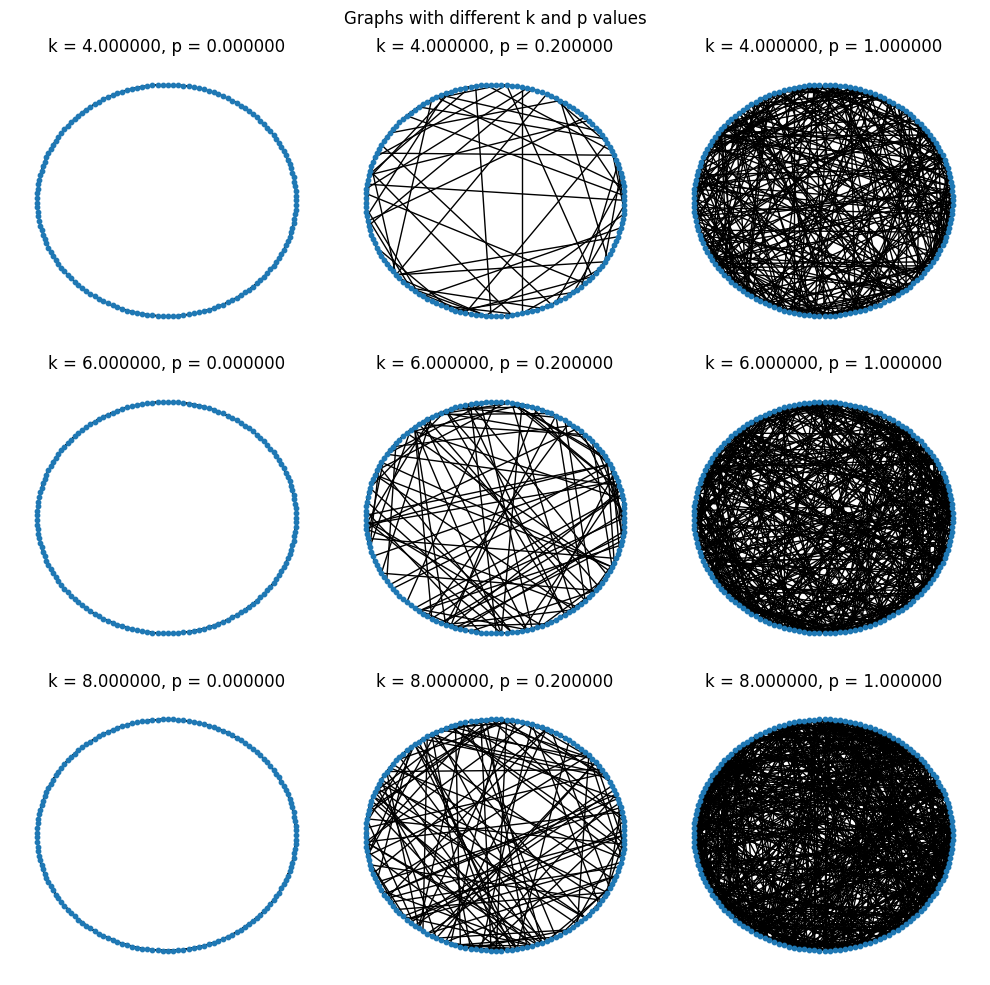

In [4]:
# Values of nodes, k and p
graph = facebook_ego_graph
k = [4, 6, 8]
p = [0, 0.2, 1]

# Generate 9 Watts-Strogatz graphs
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
    for j in range(3):
        G = watts_strogatz_graph(graph, k[i], p[j])
        ax = axes[i, j]
        ax.set_title('k = %1f, p = %1f' % (k[i], p[j]))
        nx.draw_circular(G, node_size = 10, ax=ax)

plt.xlabel("")
plt.ylabel("")
fig.suptitle('Graphs with different k and p values')
plt.tight_layout()

plt.show()

In [5]:
# Doing the same using NetworkX
# Function to plot degree distribution
def plot_degree_distribution(graph, title):
    degrees = [d for _, d in graph.degree()]
    plt.hist(degrees, bins=20, alpha=0.75, color='skyblue')
    plt.title(f"Degree Distribution of {title}")
    plt.xlabel("Degree")
    plt.ylabel("Frequency")
    plt.show()

# Function to plot clustering coefficient distribution
def plot_clustering_coefficient_distribution(graph, title):
    clustering_coeffs = nx.clustering(graph).values()  # Get clustering coefficient for each node
    plt.hist(list(clustering_coeffs), bins=20, alpha=0.75, color='orange')
    plt.title(f"Clustering Coefficient Distribution of {title}")
    plt.xlabel("Clustering Coefficient")
    plt.ylabel("Frequency")
    plt.show()

# Function to calculate and print average clustering coefficient
def get_avg_clustering_coefficient(graph, title):
    avg_clustering = nx.average_clustering(graph)
    print(f"Average Clustering Coefficient of {title}: {avg_clustering:.4f}")
    return avg_clustering


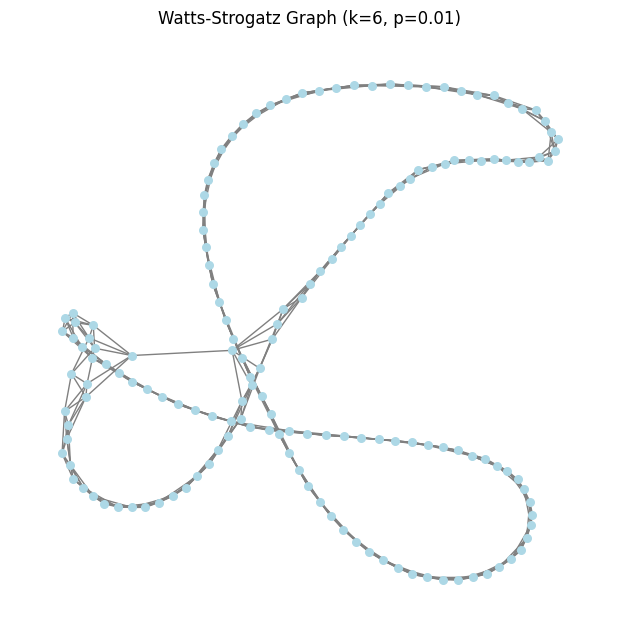

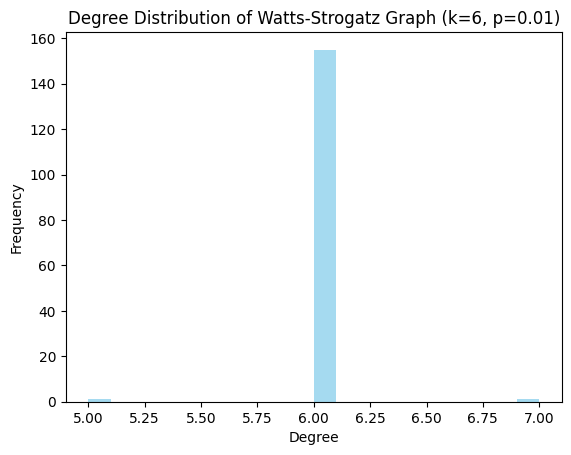

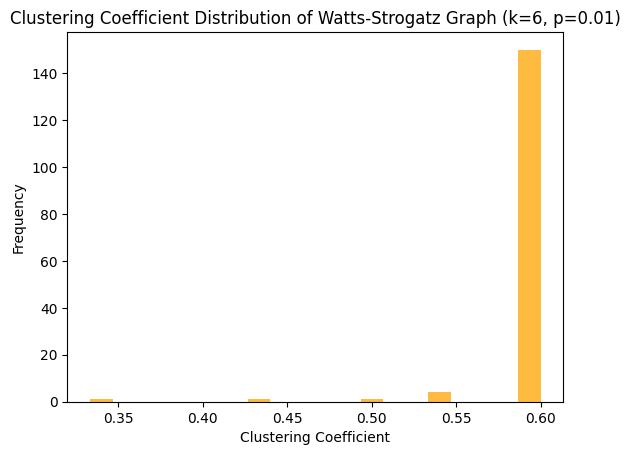

Average Clustering Coefficient of Watts-Strogatz Graph (k=6, p=0.01): 0.5949


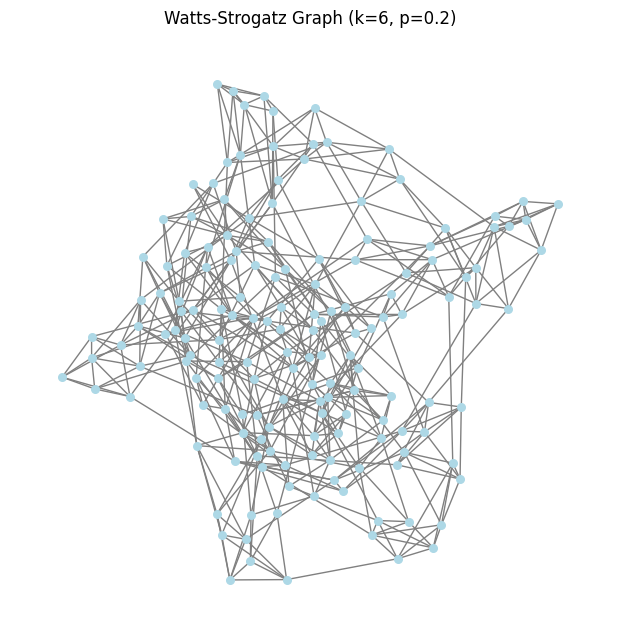

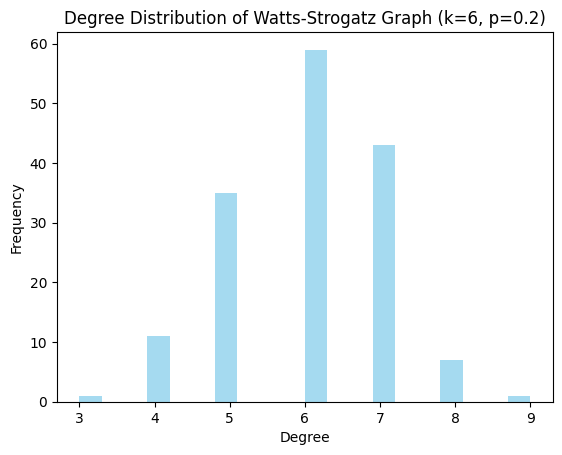

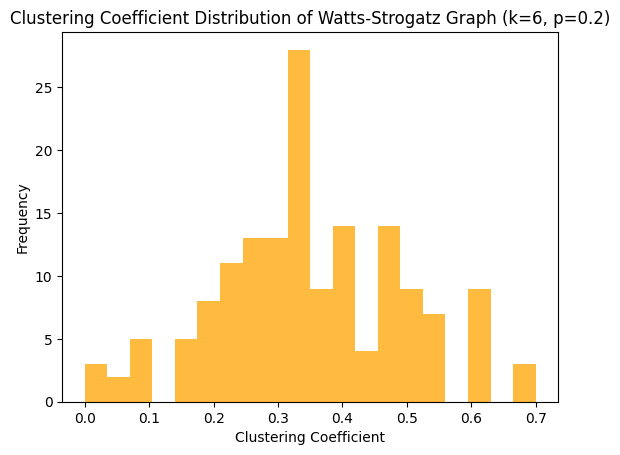

Average Clustering Coefficient of Watts-Strogatz Graph (k=6, p=0.2): 0.3509


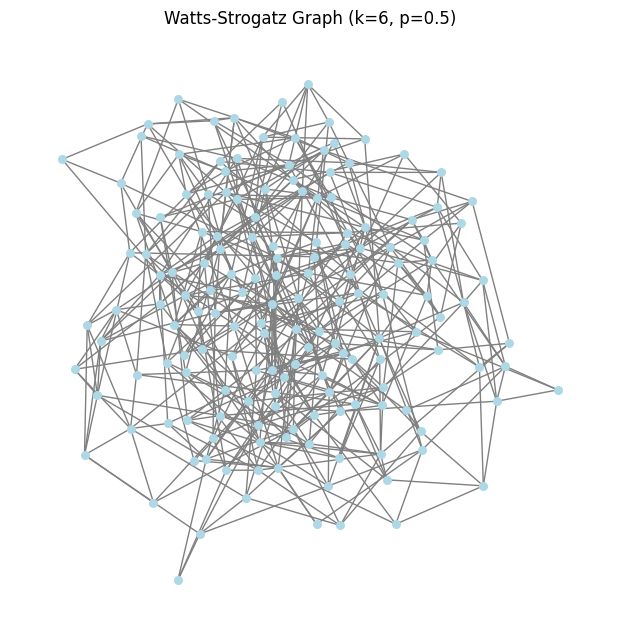

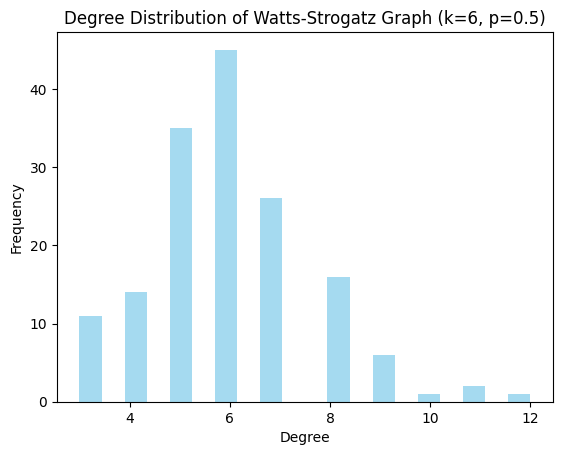

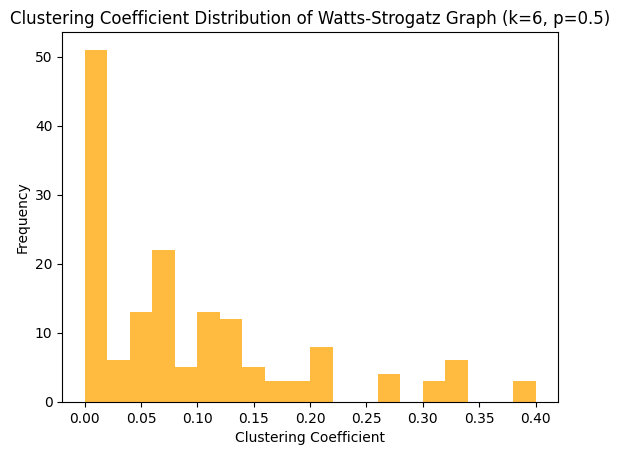

Average Clustering Coefficient of Watts-Strogatz Graph (k=6, p=0.5): 0.0911


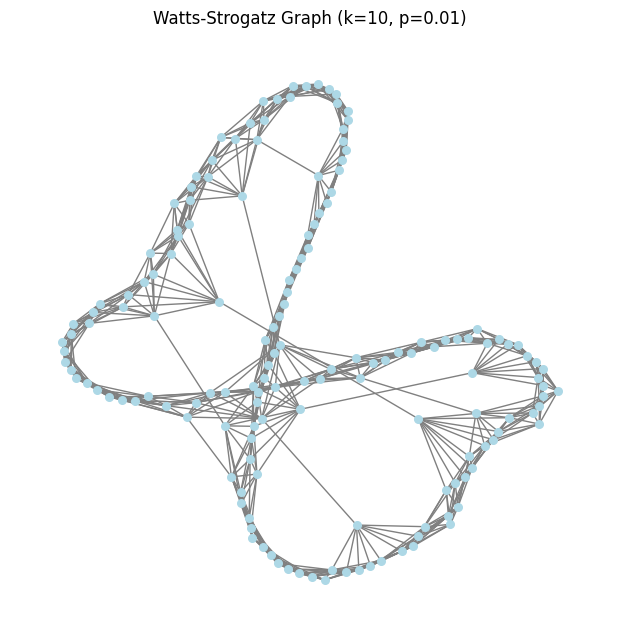

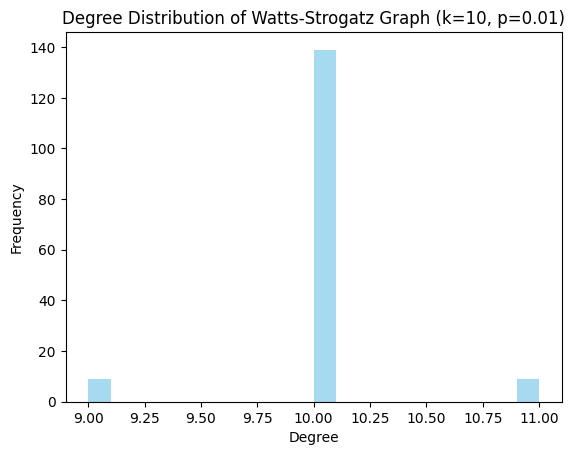

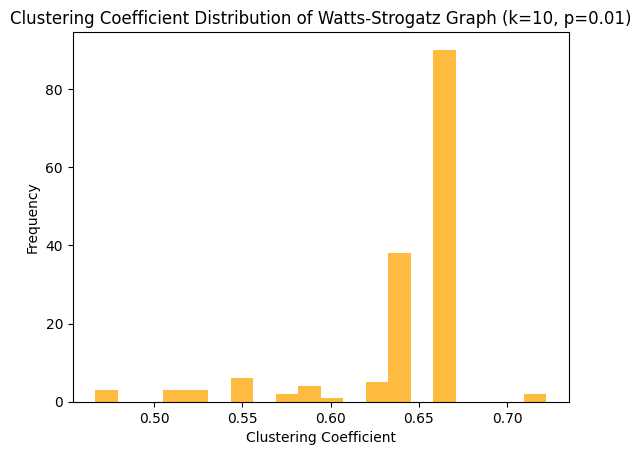

Average Clustering Coefficient of Watts-Strogatz Graph (k=10, p=0.01): 0.6428


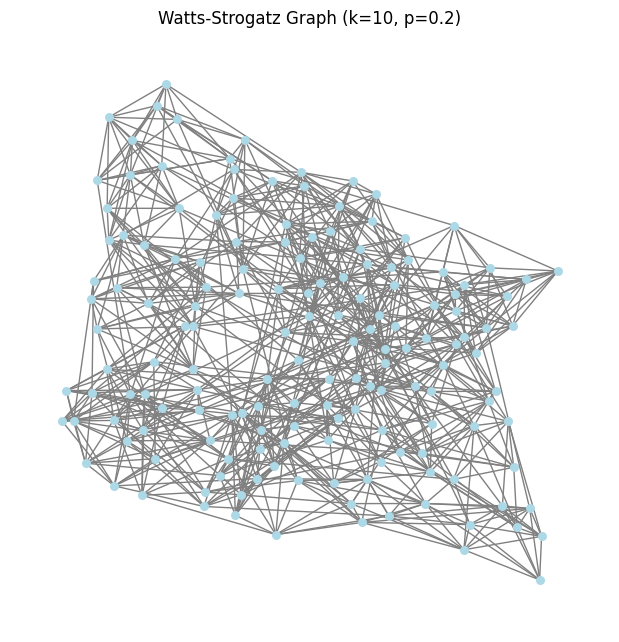

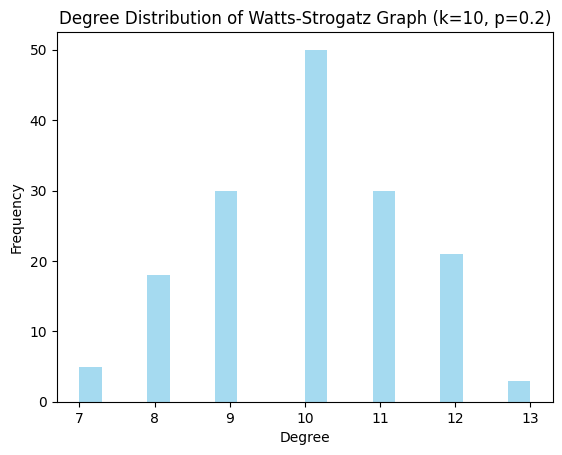

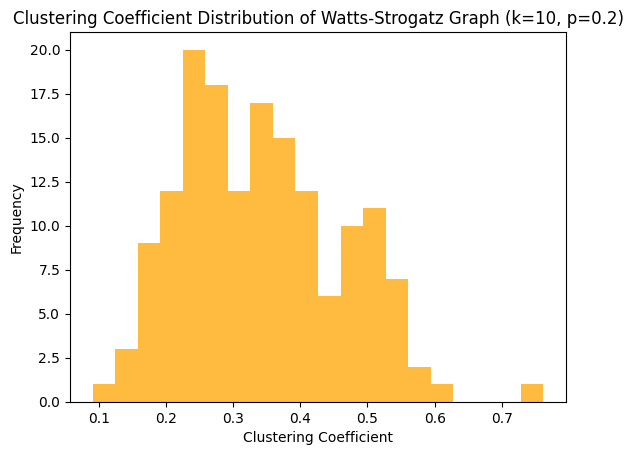

Average Clustering Coefficient of Watts-Strogatz Graph (k=10, p=0.2): 0.3425


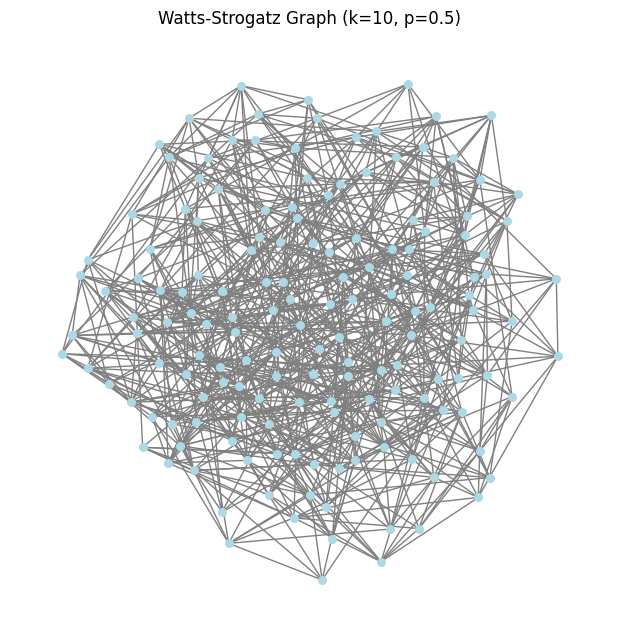

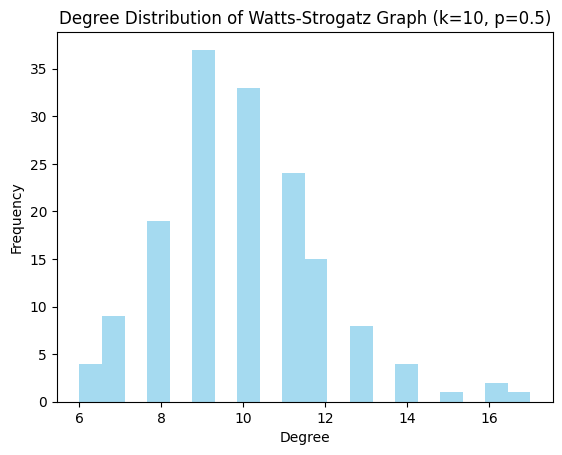

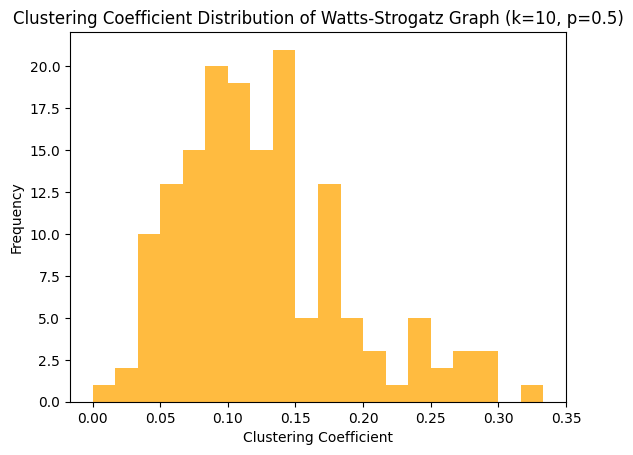

Average Clustering Coefficient of Watts-Strogatz Graph (k=10, p=0.5): 0.1240


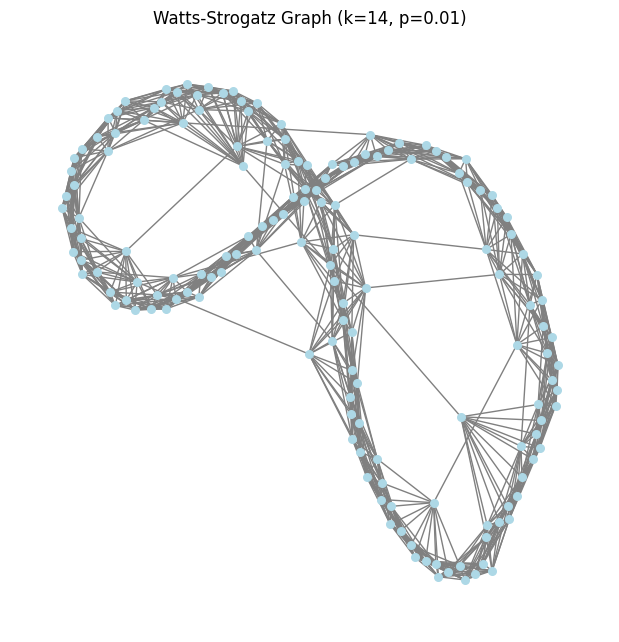

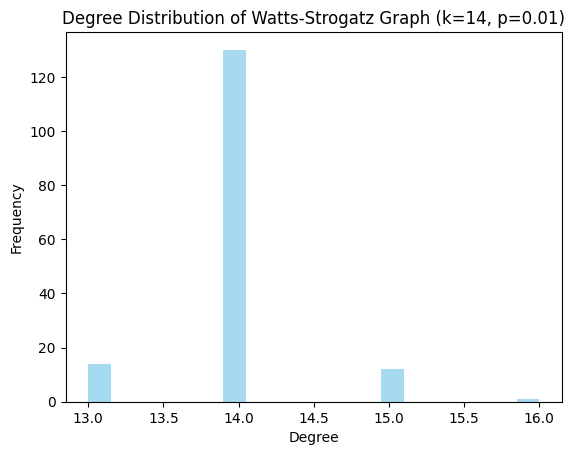

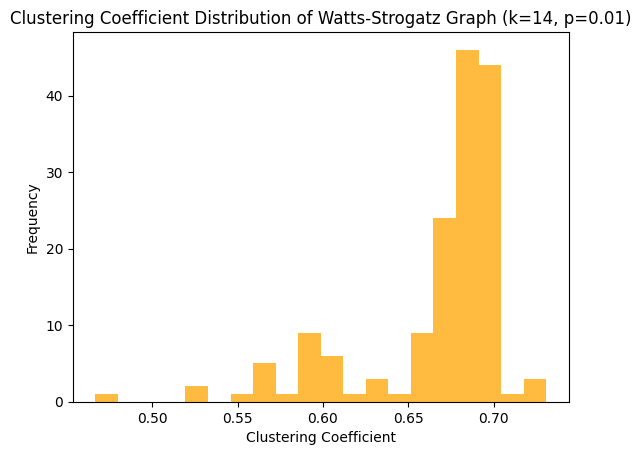

Average Clustering Coefficient of Watts-Strogatz Graph (k=14, p=0.01): 0.6638


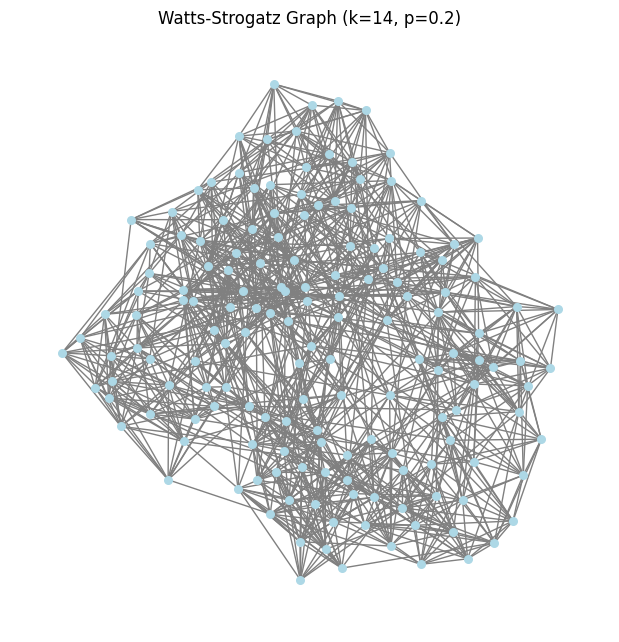

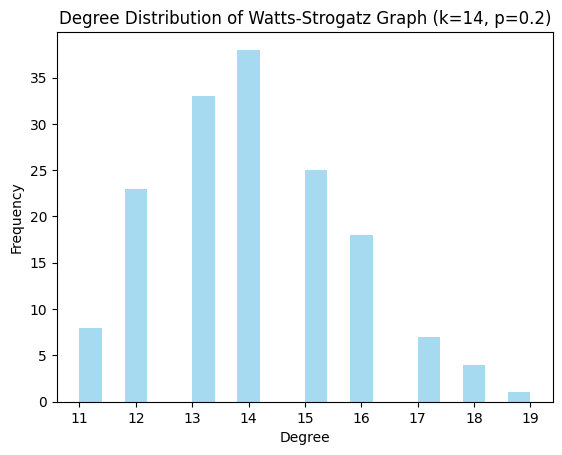

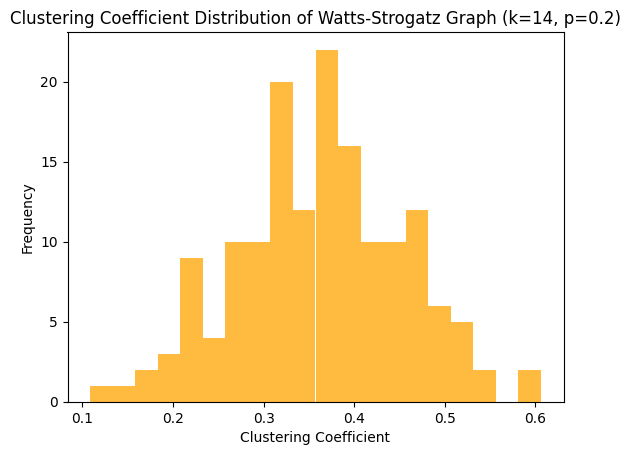

Average Clustering Coefficient of Watts-Strogatz Graph (k=14, p=0.2): 0.3621


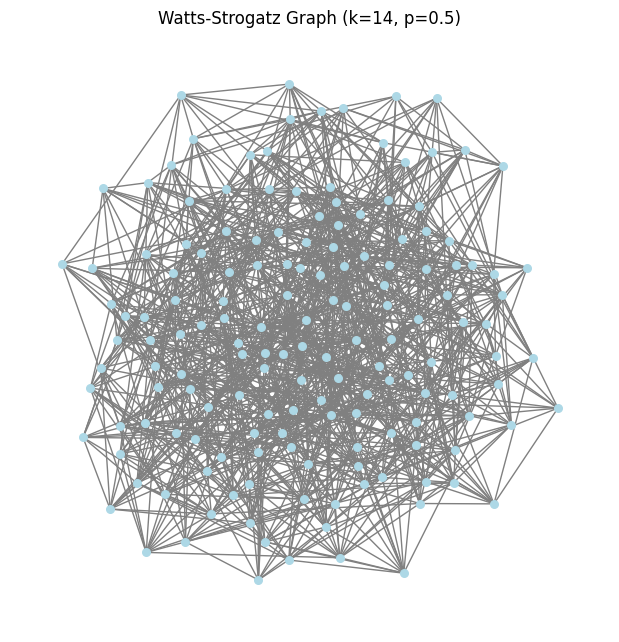

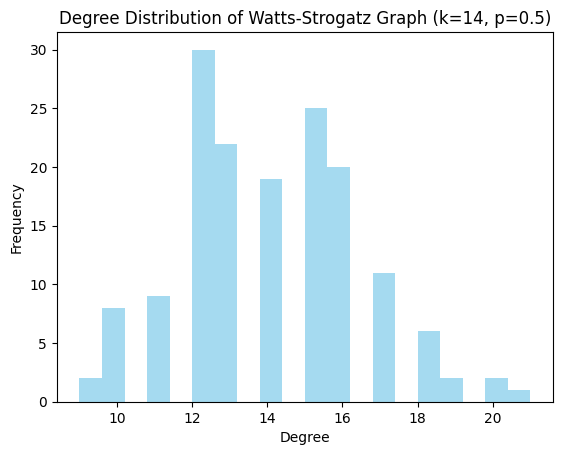

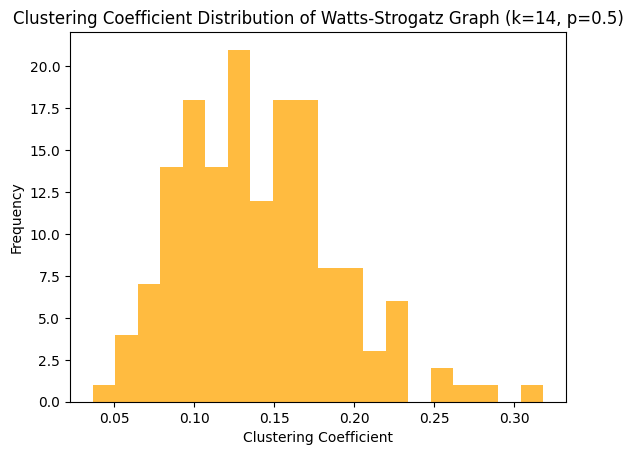

Average Clustering Coefficient of Watts-Strogatz Graph (k=14, p=0.5): 0.1404


In [6]:
# Values of n, k and p
n = facebook_ego_graph.number_of_nodes()
k_values = [6, 10, 14] 
p_values = [0.01, 0.2, 0.5] 

# Generate 9 Watts-Strogatz graphs and analyze them
for k in k_values:
    for p in p_values:
        ws_graph = nx.watts_strogatz_graph(n, k, p)

        # Plot the graph structure
        plt.figure(figsize=(6, 6))
        nx.draw(ws_graph, node_size=30, node_color='lightblue', edge_color='gray', with_labels=False)
        plt.title(f"Watts-Strogatz Graph (k={k}, p={p})")
        plt.show()

        # Plot the degree distribution
        plot_degree_distribution(ws_graph, f"Watts-Strogatz Graph (k={k}, p={p})")

        # Plot the clustering coefficient distribution
        plot_clustering_coefficient_distribution(ws_graph, f"Watts-Strogatz Graph (k={k}, p={p})")

        # Calculate and print the average clustering coefficient
        get_avg_clustering_coefficient(ws_graph, f"Watts-Strogatz Graph (k={k}, p={p})")


(b) Generate scale-free graphs, and each of them should have the same number of nodes as FacebookEgo. Please generate 3 graphs with three different values of γ. Please plot the graph structures,
degree distributions, and clustering coefficients as well.

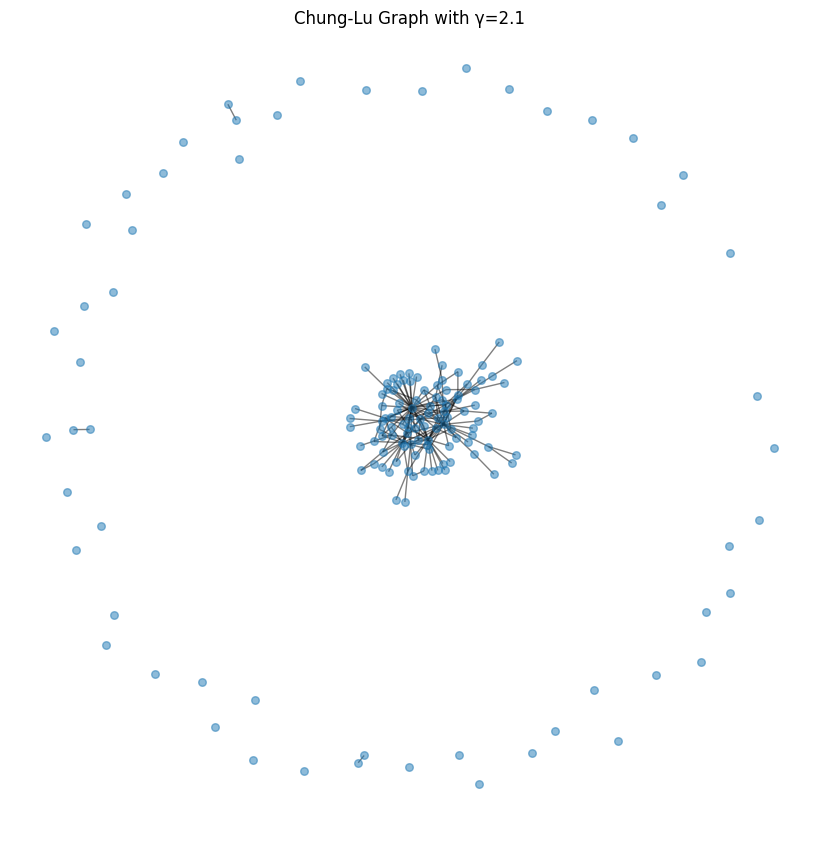

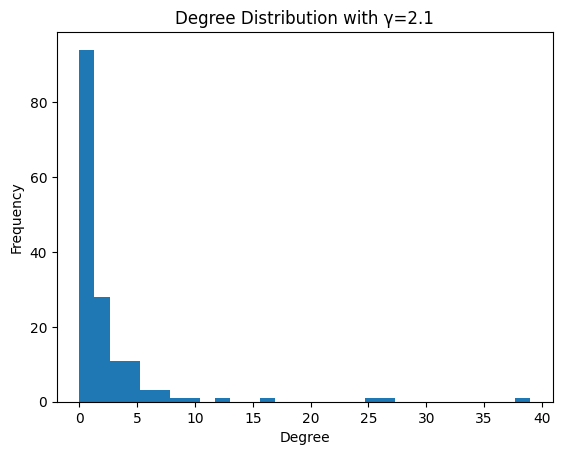

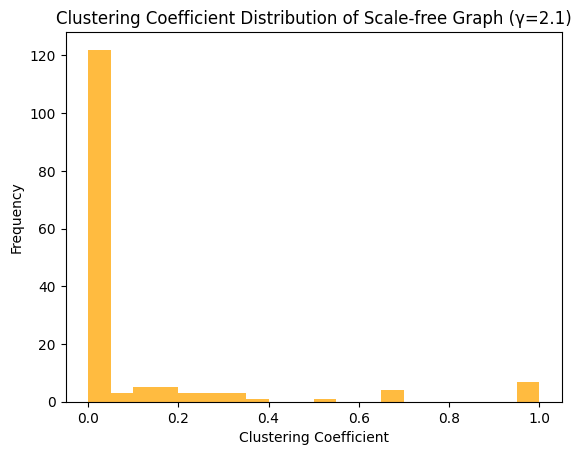

Average Clustering Coefficient with γ=2.1: 0.0938


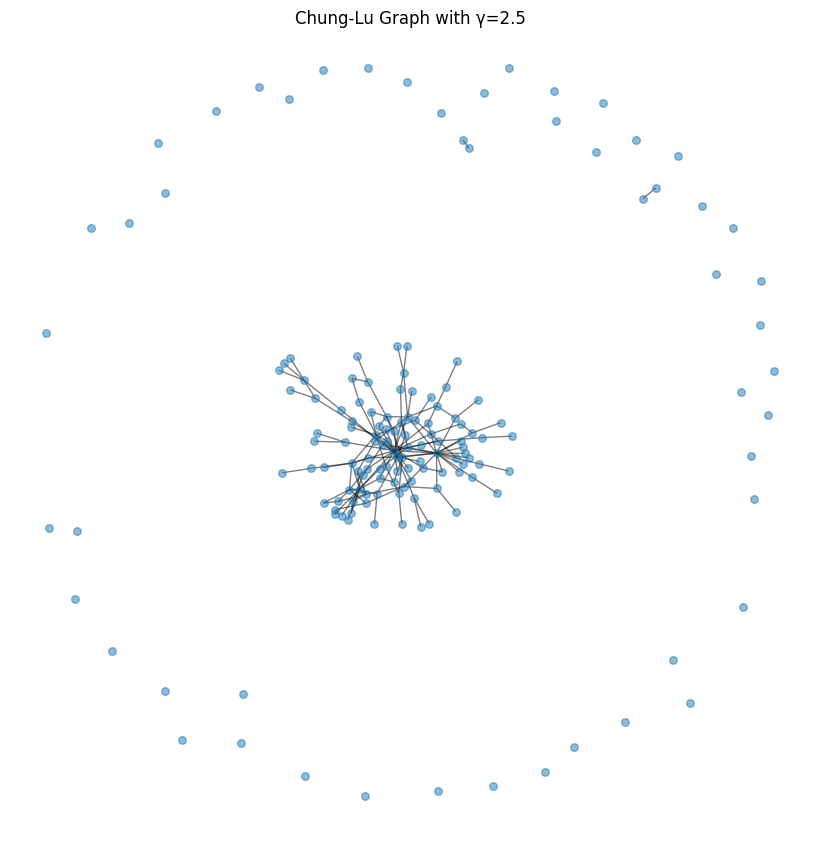

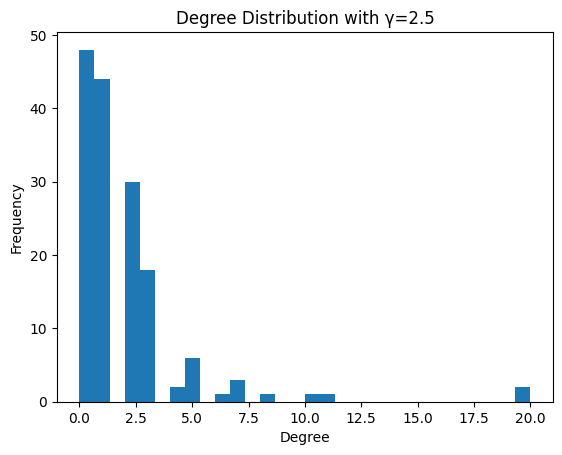

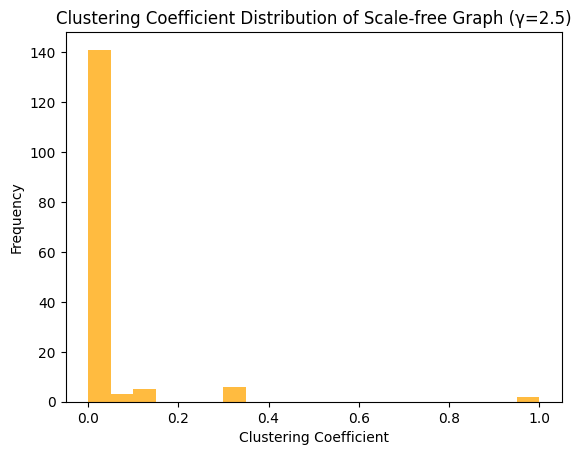

Average Clustering Coefficient with γ=2.5: 0.0315


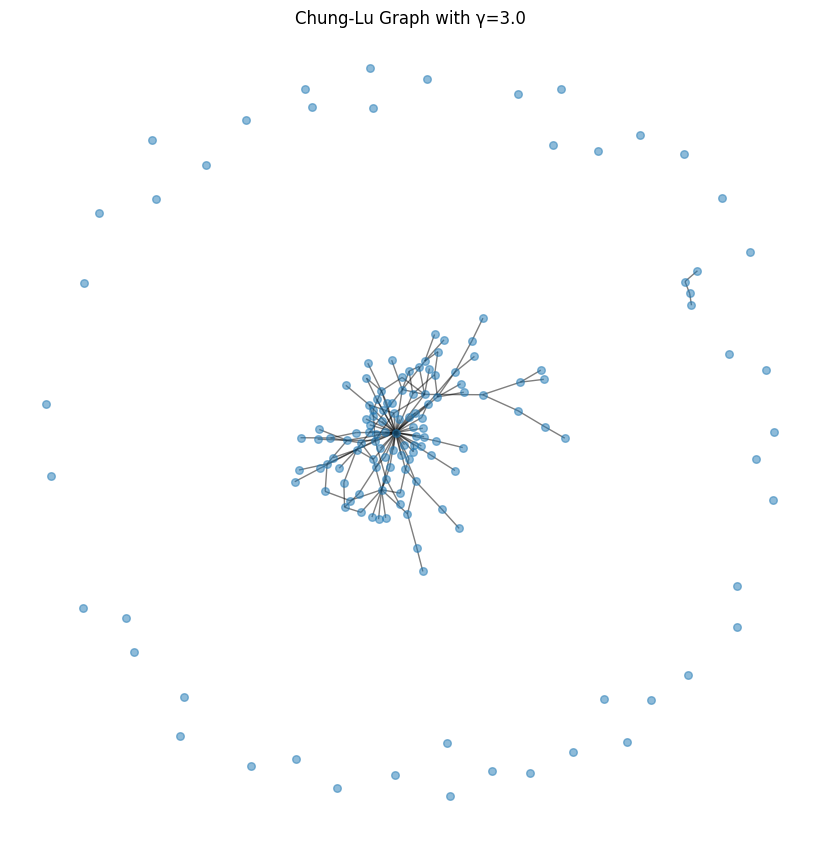

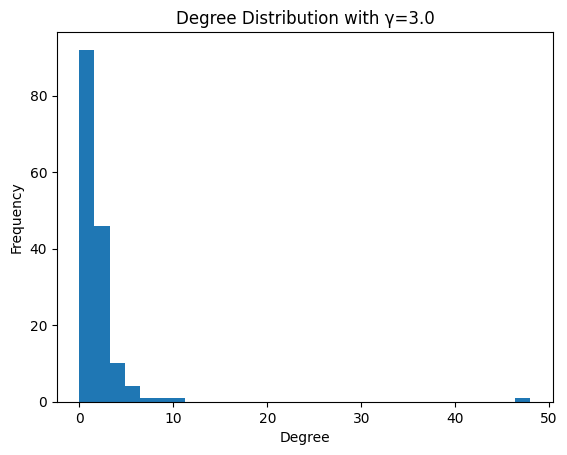

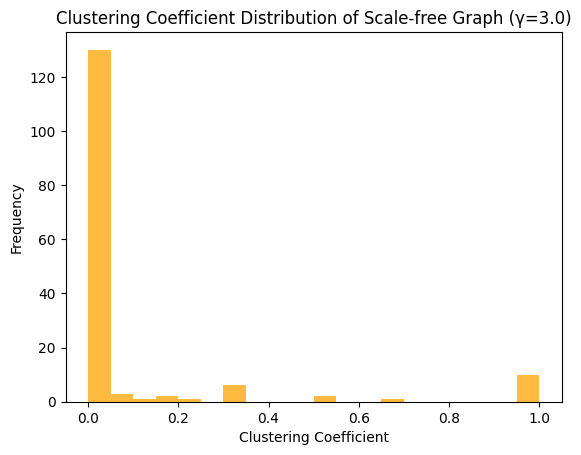

Average Clustering Coefficient with γ=3.0: 0.0934


In [7]:
# Parameters
num_nodes = facebook_ego_graph.number_of_nodes()  
gamma_values = [2.1, 2.5, 3.0]  # Different values for gamma

# Function to generate a degree sequence based on a power-law distribution
def generate_degree_sequence(n, gamma):
    degree_sequence = np.random.zipf(gamma, n)
    degree_sequence = degree_sequence[degree_sequence < n]  # Ensure degrees are less than n
    return degree_sequence

# Function to generate a graph using the Chung-Lu model
def generate_chung_lu_graph(degree_sequence):
    G = nx.expected_degree_graph(degree_sequence, selfloops=False)
    return G

# Plot graphs, degree distributions, and calculate clustering coefficients
for gamma in gamma_values:
    degree_sequence = generate_degree_sequence(num_nodes, gamma)
    
    # Generate a Chung-Lu graph based on the degree sequence
    G = generate_chung_lu_graph(degree_sequence)
    
    # Plot the graph
    plt.figure(figsize=(8, 8))
    nx.draw_spring(G, node_size=30, alpha=0.5)
    plt.title(f"Chung-Lu Graph with γ={gamma}")
    plt.show()
    
    # Plot the degree distribution
    degrees = [G.degree(n) for n in G.nodes()]
    plt.hist(degrees, bins=30)
    plt.title(f"Degree Distribution with γ={gamma}")
    plt.xlabel('Degree')
    plt.ylabel('Frequency')
    plt.show()
    
    # Plot the clustering coefficient distribution
    plot_clustering_coefficient_distribution(G, f"Scale-free Graph (γ={gamma})")

    # Calculate and print the average clustering coefficient
    avg_clustering = nx.average_clustering(G)
    print(f"Average Clustering Coefficient with γ={gamma}: {avg_clustering:.4f}")


(c) Generate graphs based on Barab´asi-Albert Model, and each of them should have the same number
of nodes as Facebook-Ego. Please generate 9 graphs with three different values of m0 and m.
Please plot the graph structures, degree distributions, and clustering coefficients as well.

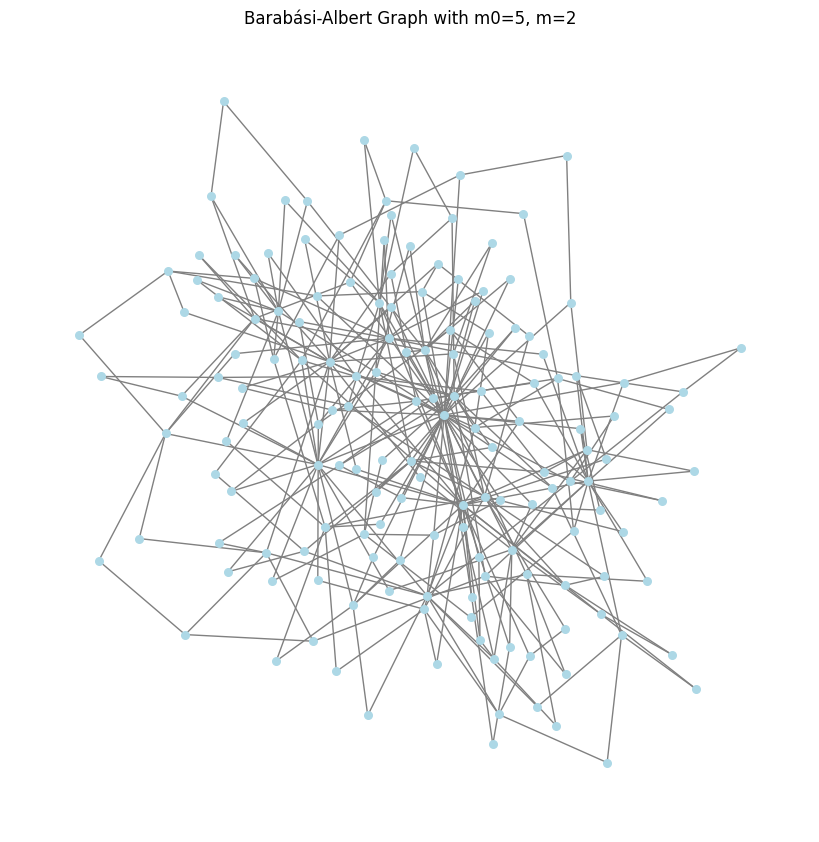

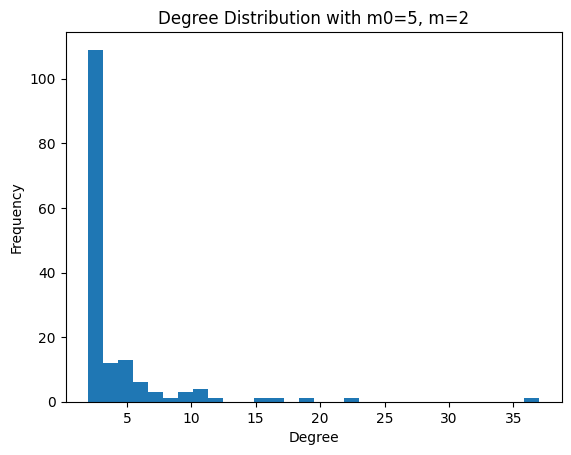

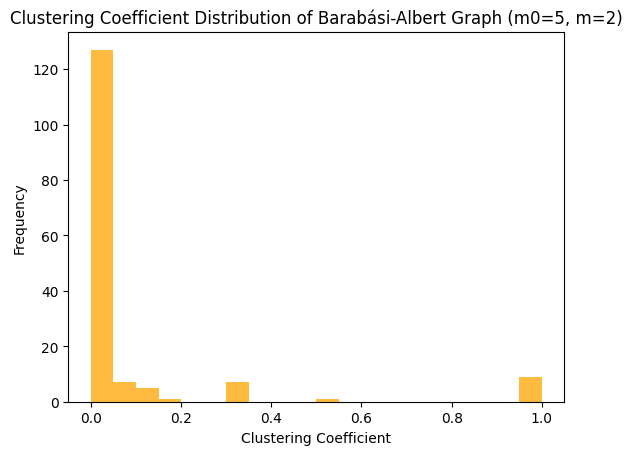

Average Clustering Coefficient with m0=5, m=2: 0.0847


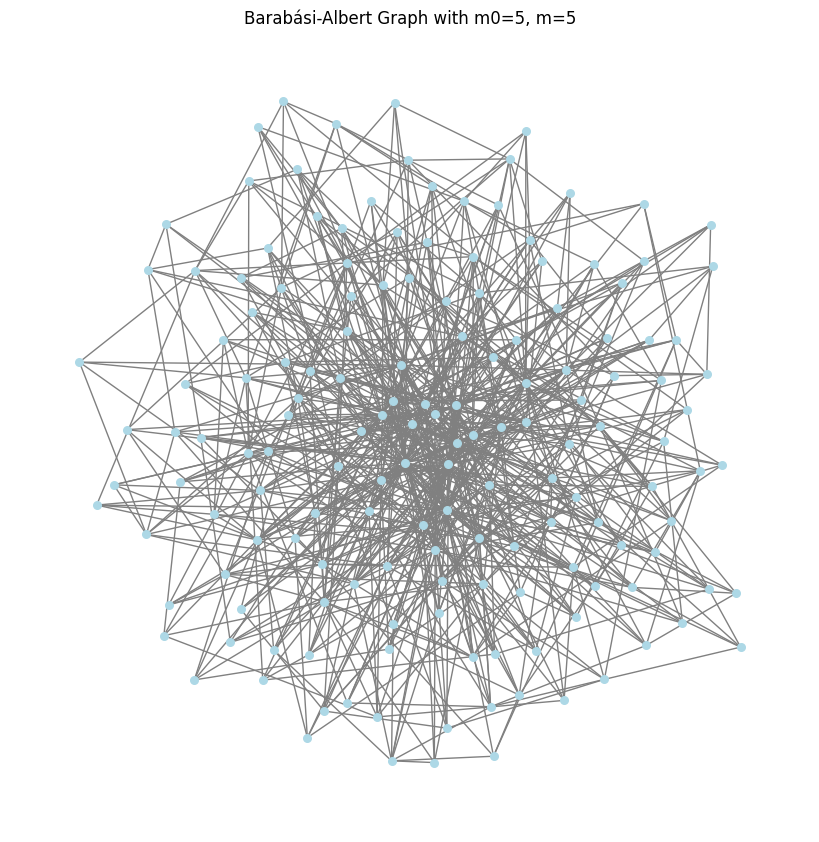

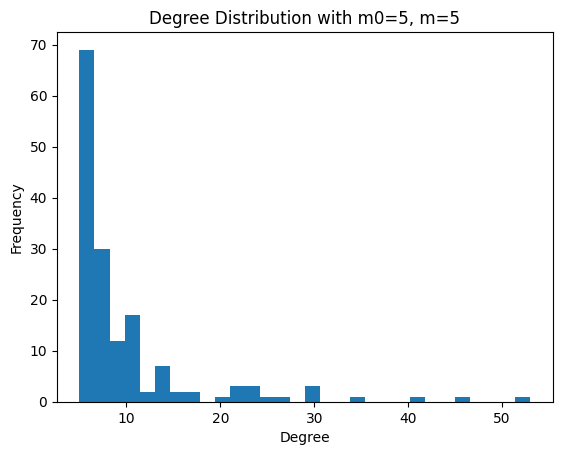

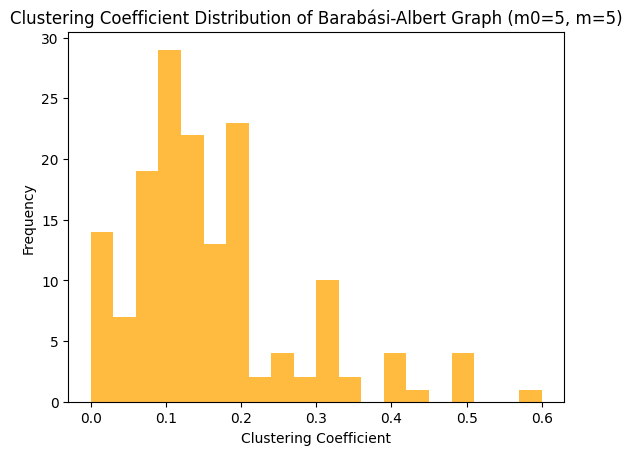

Average Clustering Coefficient with m0=5, m=5: 0.1577


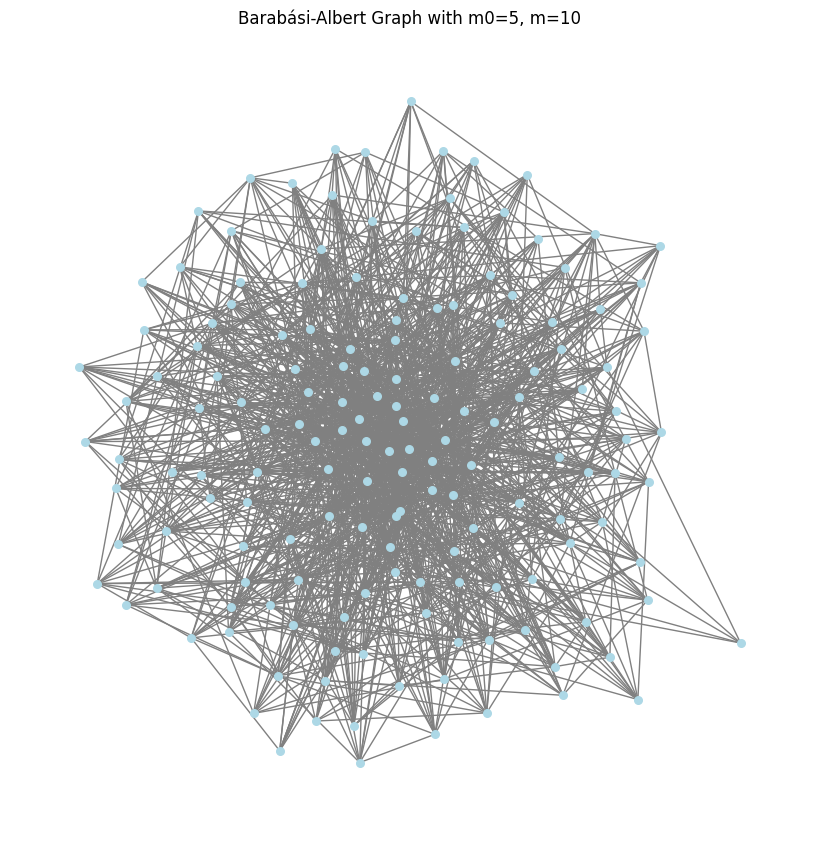

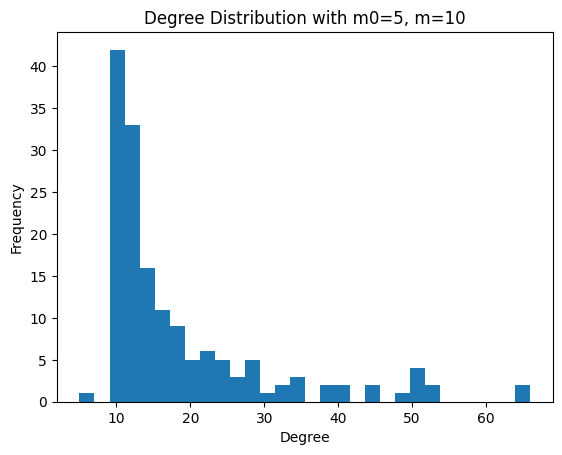

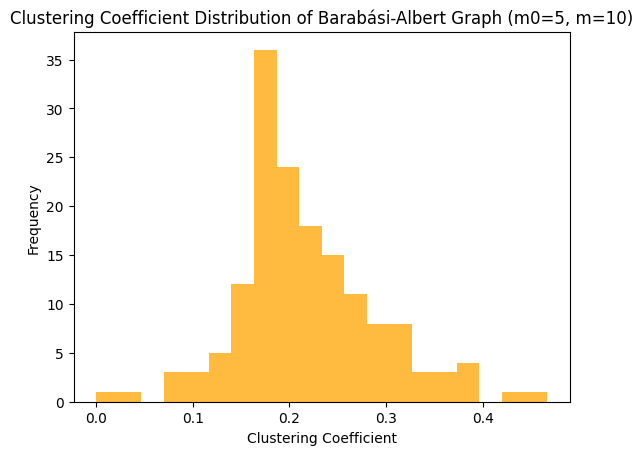

Average Clustering Coefficient with m0=5, m=10: 0.2168


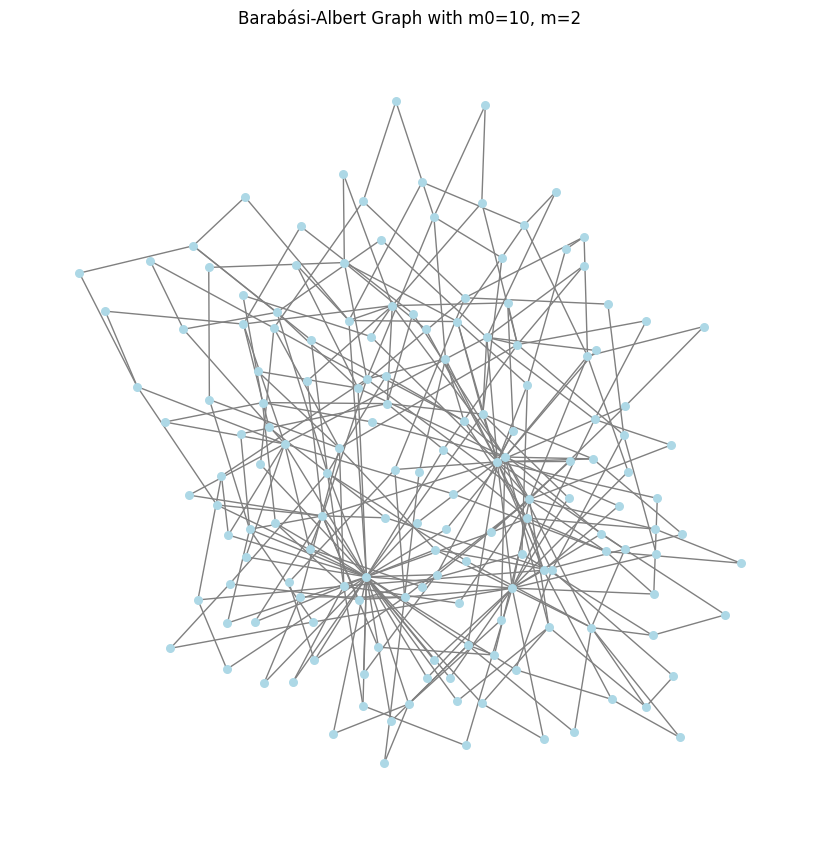

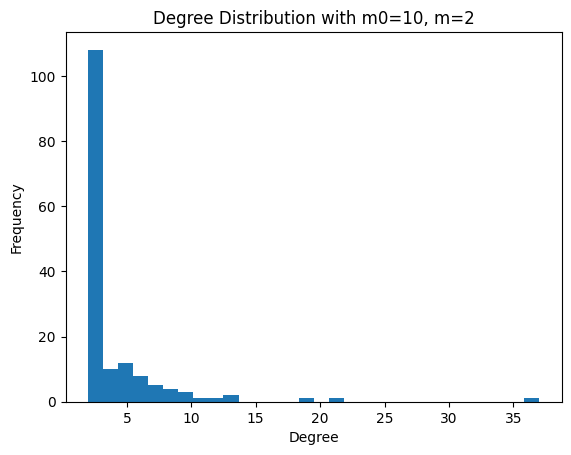

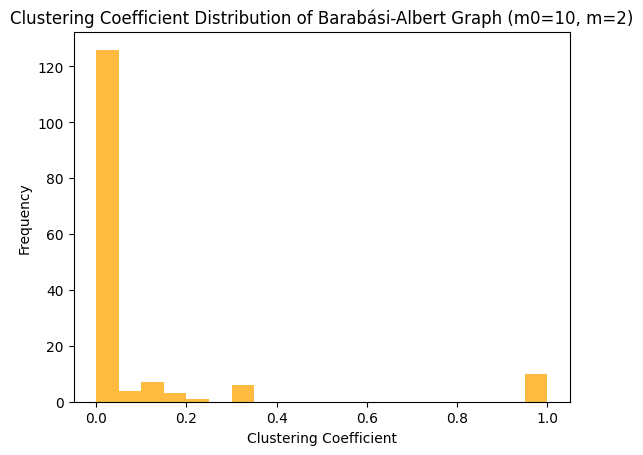

Average Clustering Coefficient with m0=10, m=2: 0.0904


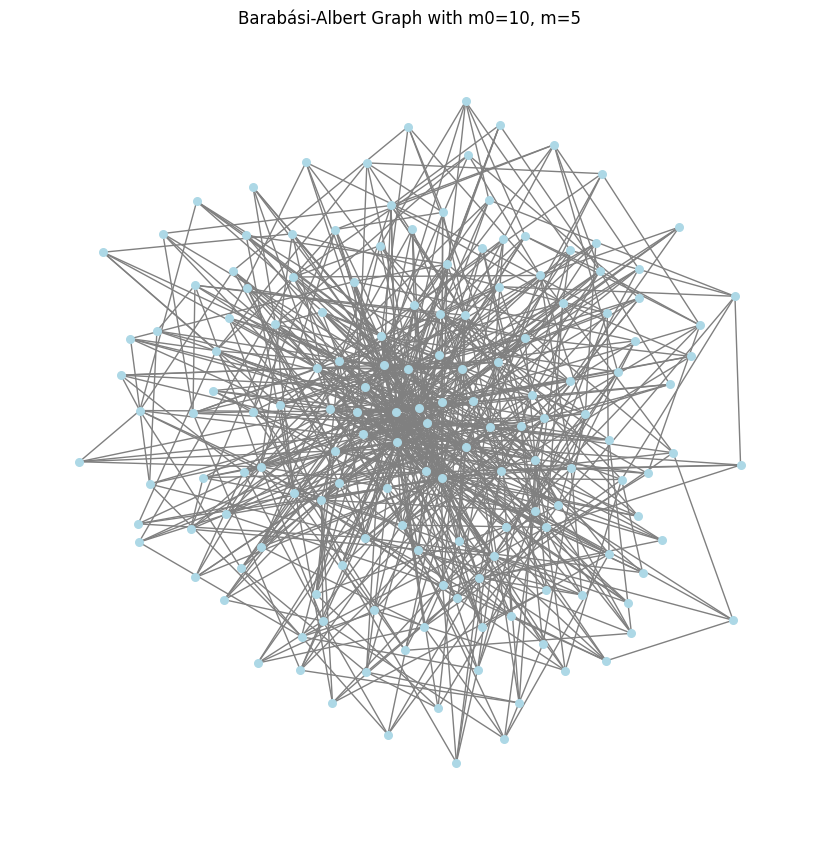

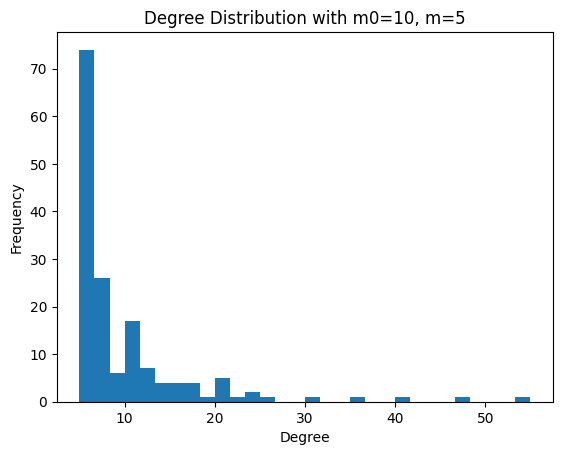

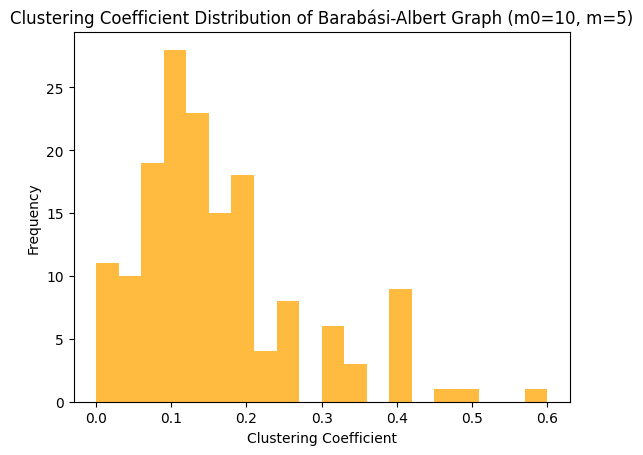

Average Clustering Coefficient with m0=10, m=5: 0.1585


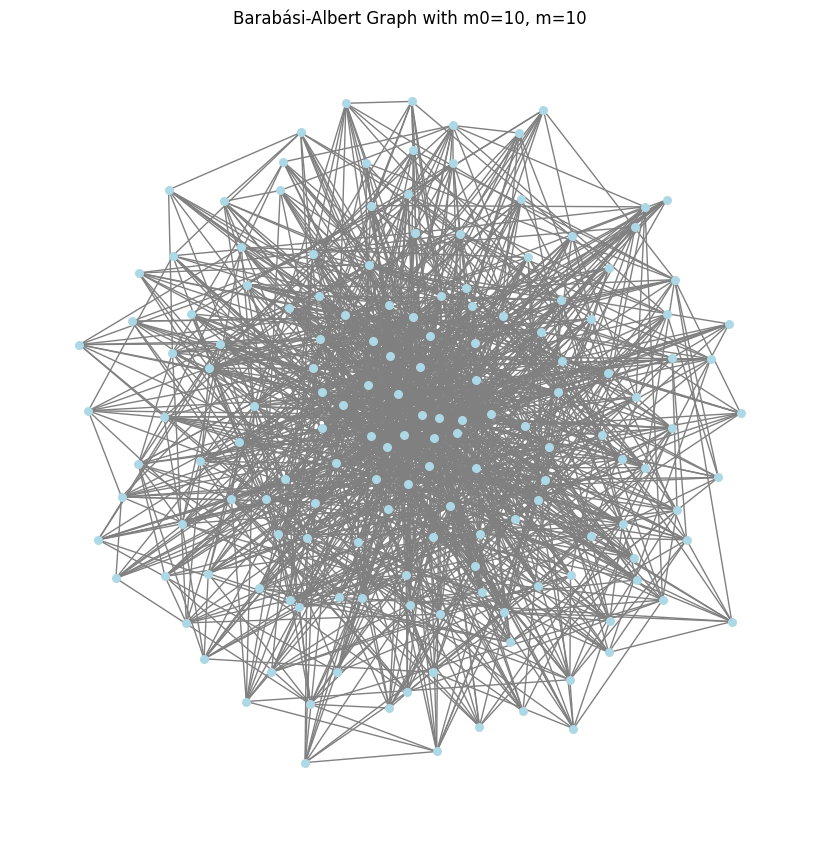

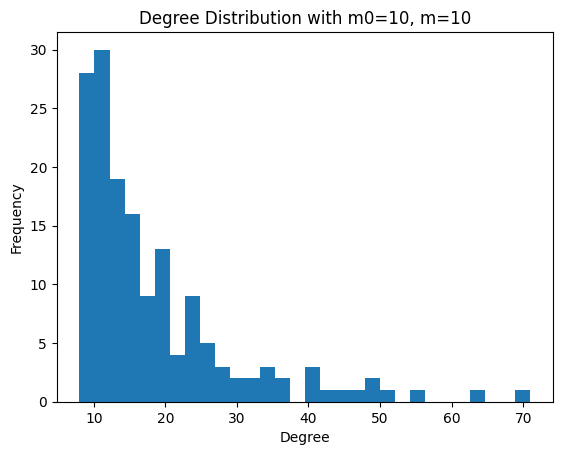

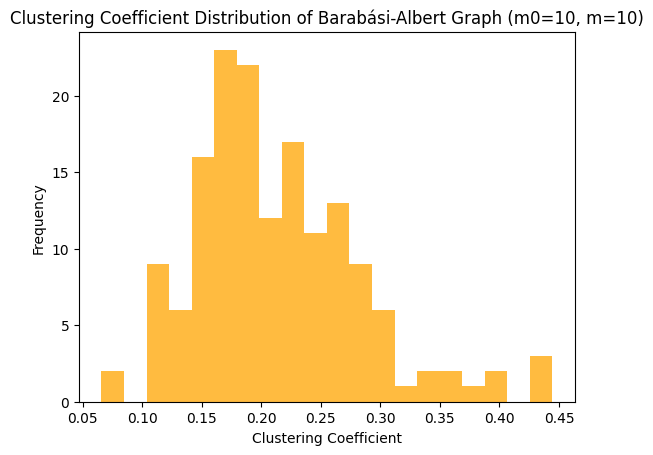

Average Clustering Coefficient with m0=10, m=10: 0.2132


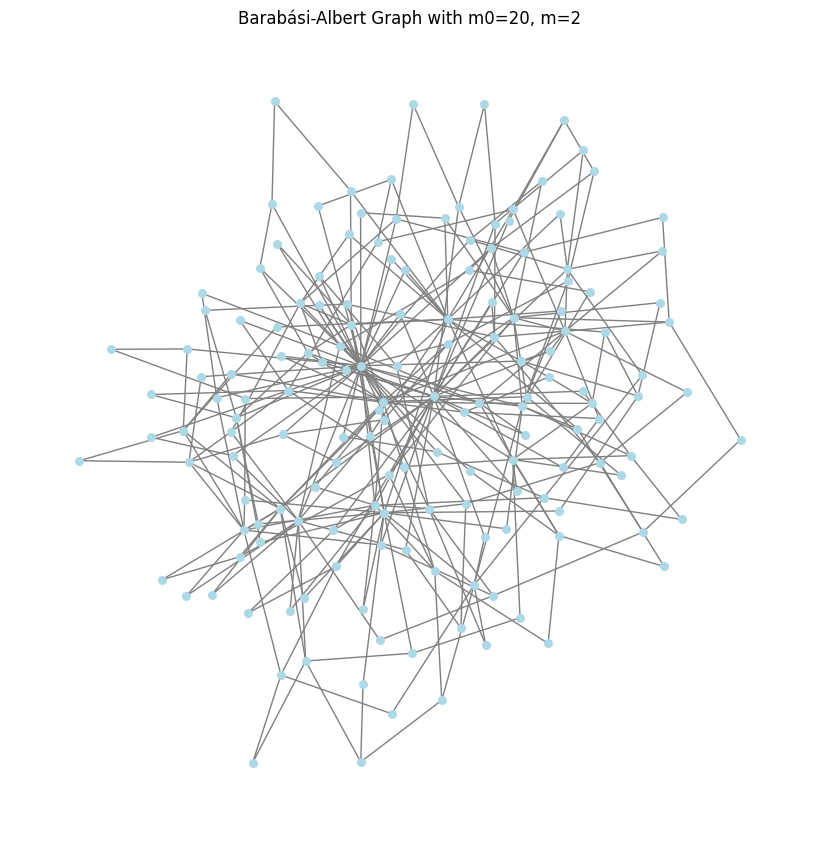

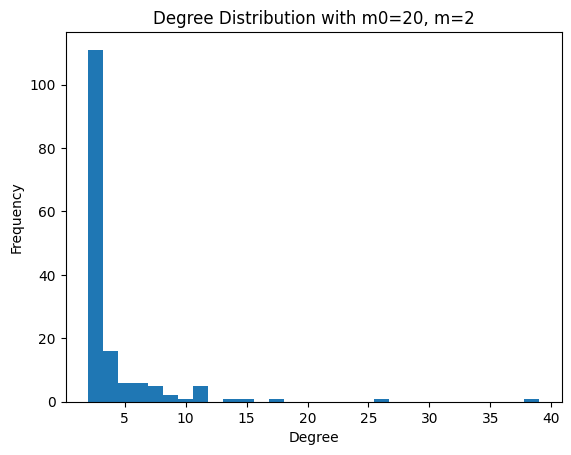

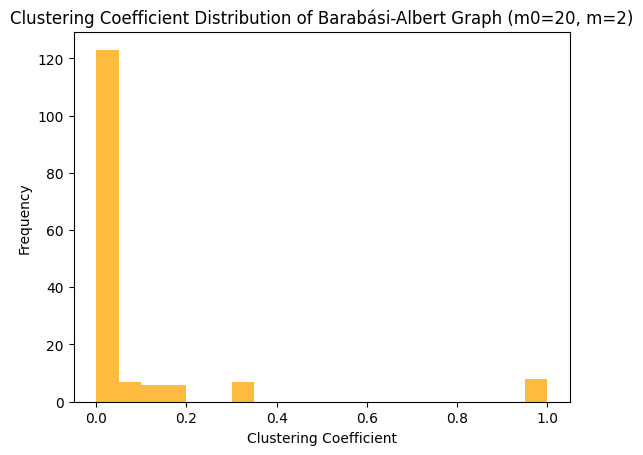

Average Clustering Coefficient with m0=20, m=2: 0.0814


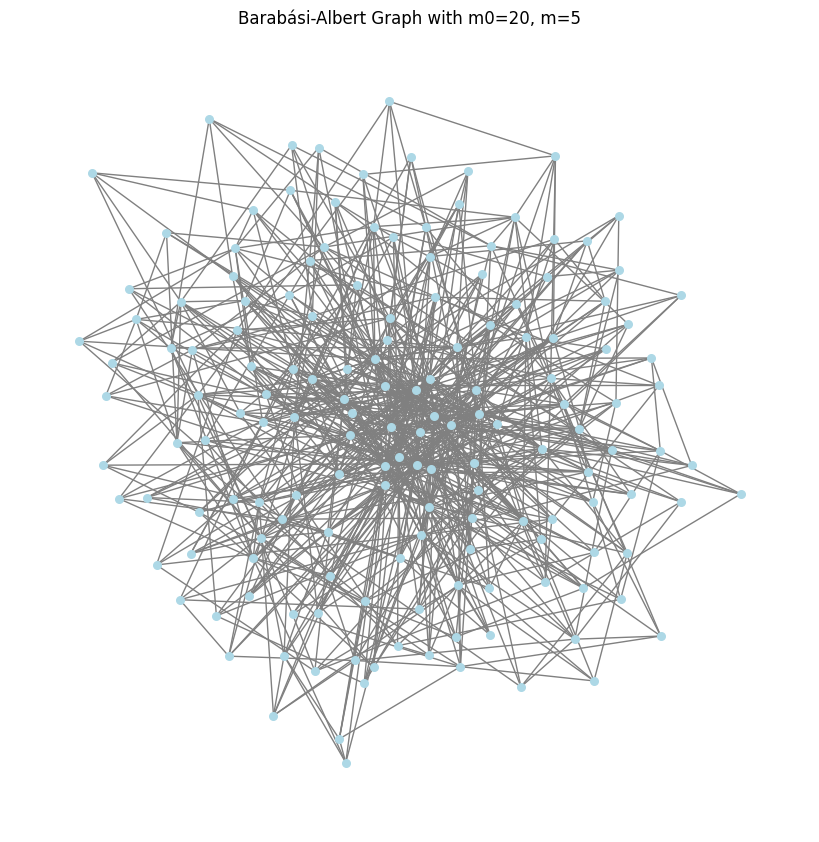

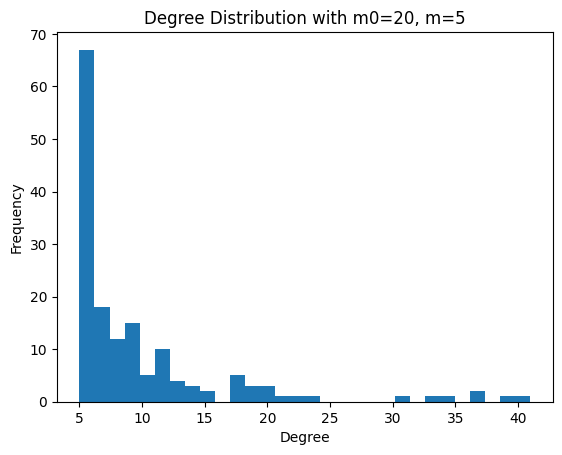

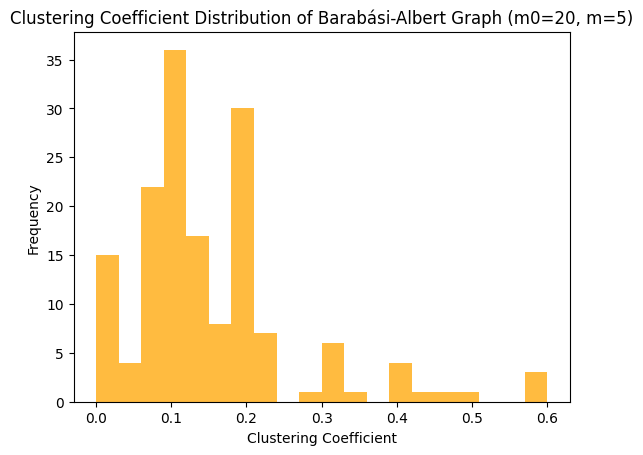

Average Clustering Coefficient with m0=20, m=5: 0.1523


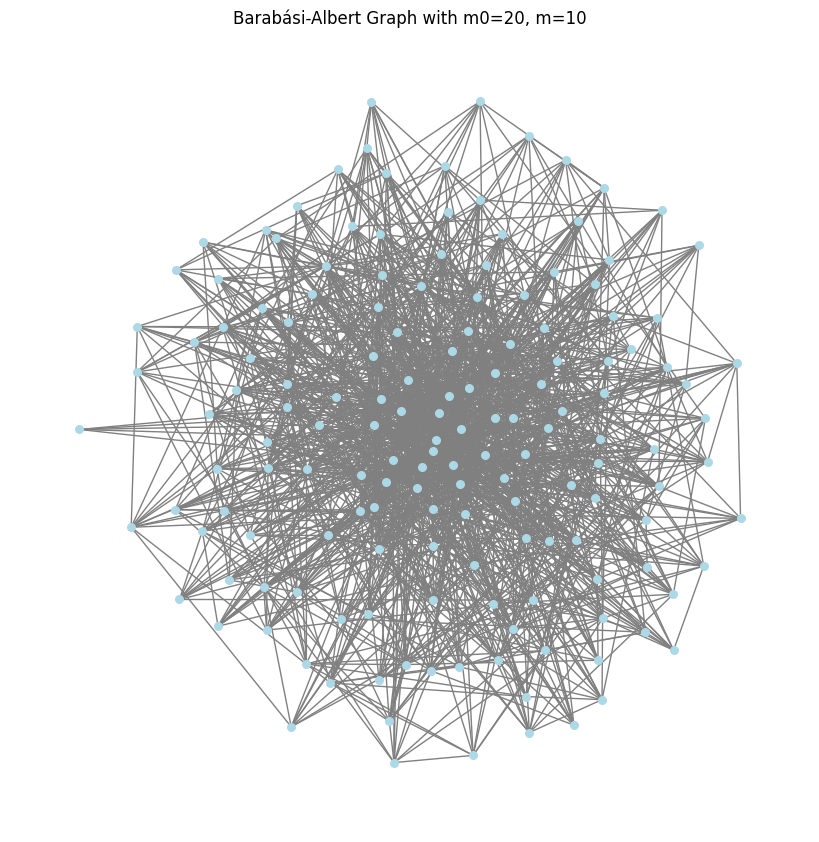

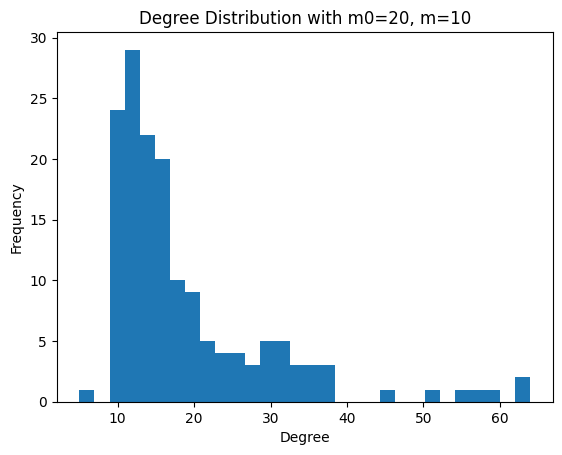

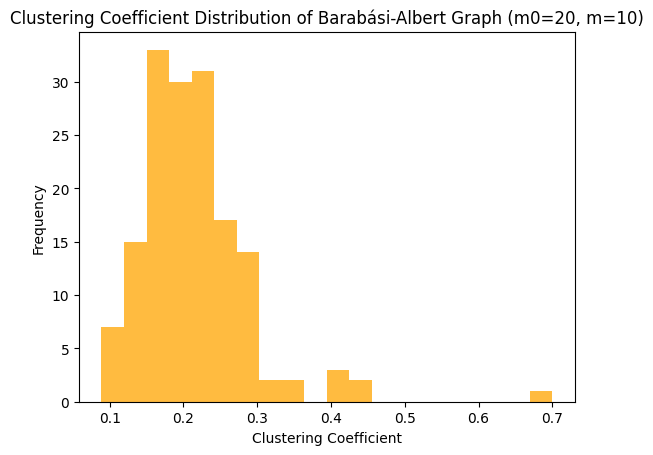

Average Clustering Coefficient with m0=20, m=10: 0.2137


In [8]:
# Parameters for Barabási-Albert model
num_nodes = facebook_ego_graph.number_of_nodes() 
initial_nodes_values = [5, 10, 20]  # Different initial number of nodes (m0)
edges_per_node_values = [2, 5, 10]  # Different number of edges per new node (m)

# Function to generate a graph using the Barabási-Albert model
def generate_ba_graph(n, m0, m):
    G = nx.barabasi_albert_graph(n, m)
    return G

# Plot graphs, degree distributions, and calculate clustering coefficients
for m0 in initial_nodes_values:
    for m in edges_per_node_values:
        G = generate_ba_graph(num_nodes, m0, m)
        
        # Plot the graph
        plt.figure(figsize=(8, 8))
        nx.draw(G, node_size=30, node_color='lightblue', edge_color='gray', with_labels=False)
        plt.title(f"Barabási-Albert Graph with m0={m0}, m={m}")
        plt.show()

        # Plot the degree distribution
        degrees = [G.degree(n) for n in G.nodes()]
        plt.hist(degrees, bins=30)
        plt.title(f"Degree Distribution with m0={m0}, m={m}")
        plt.xlabel('Degree')
        plt.ylabel('Frequency')
        plt.show()
        
        # Plot the clustering coefficient distribution
        plot_clustering_coefficient_distribution(G, f"Barabási-Albert Graph (m0={m0}, m={m})")

        # Calculate and print the average clustering coefficient
        avg_clustering = nx.average_clustering(G)
        print(f"Average Clustering Coefficient with m0={m0}, m={m}: {avg_clustering:.4f}")


(d) Please compare your Facebook-Ego network, Twitter-Ego network with the generated random
graphs in (a), (b) and (c). Which random graph(s) approximates your networks at most? Why?

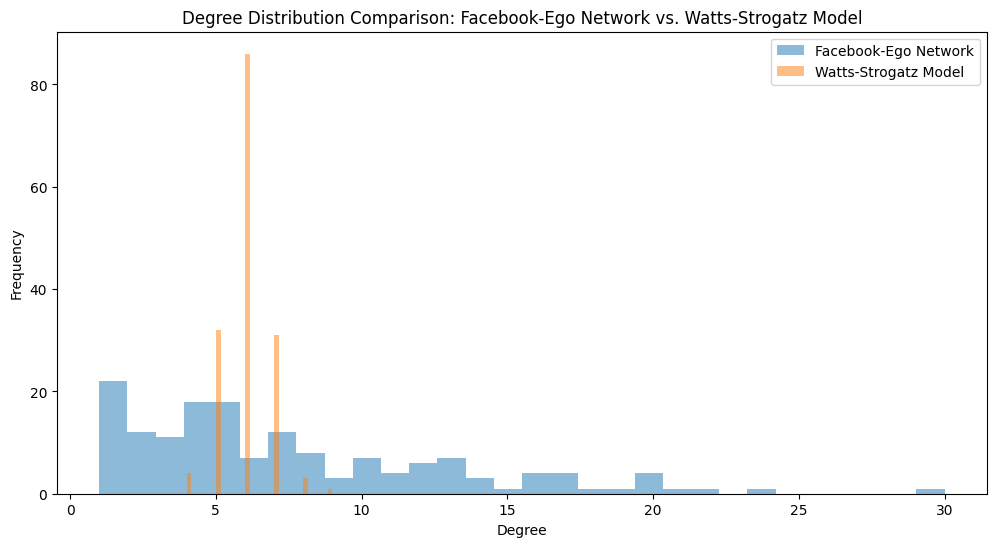

Average Clustering Coefficient of Facebook-Ego Network: 0.3947
Average Clustering Coefficient of Watts-Strogatz Model: 0.4478

Average Path Length of Facebook-Ego Network: 4.0970
Average Path Length of Watts-Strogatz Model: 4.1283



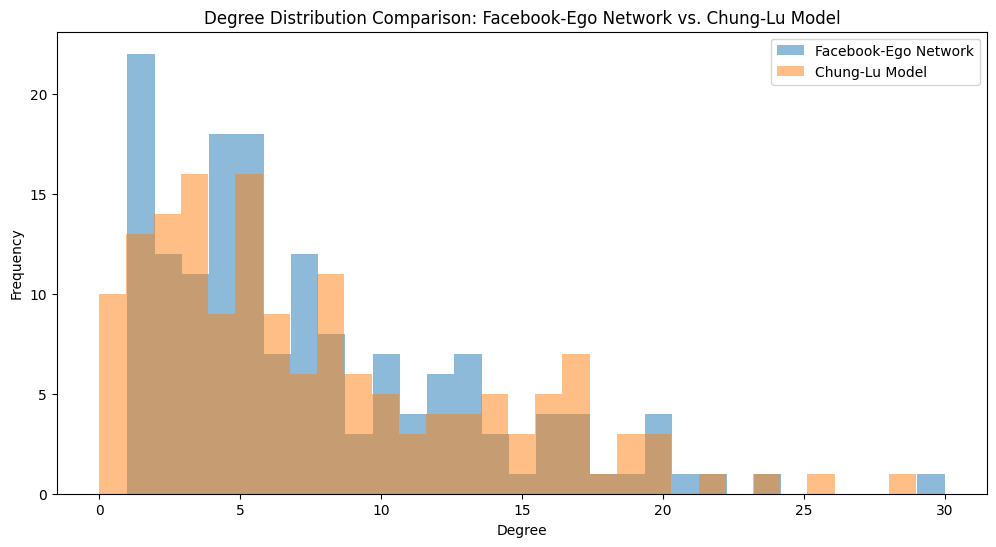

Average Clustering Coefficient of Facebook-Ego Network: 0.3947
Average Clustering Coefficient of Chung-Lu Model: 0.1006

Average Path Length of Facebook-Ego Network: 4.0970
Average Path Length of Chung-Lu Model: 2.6720



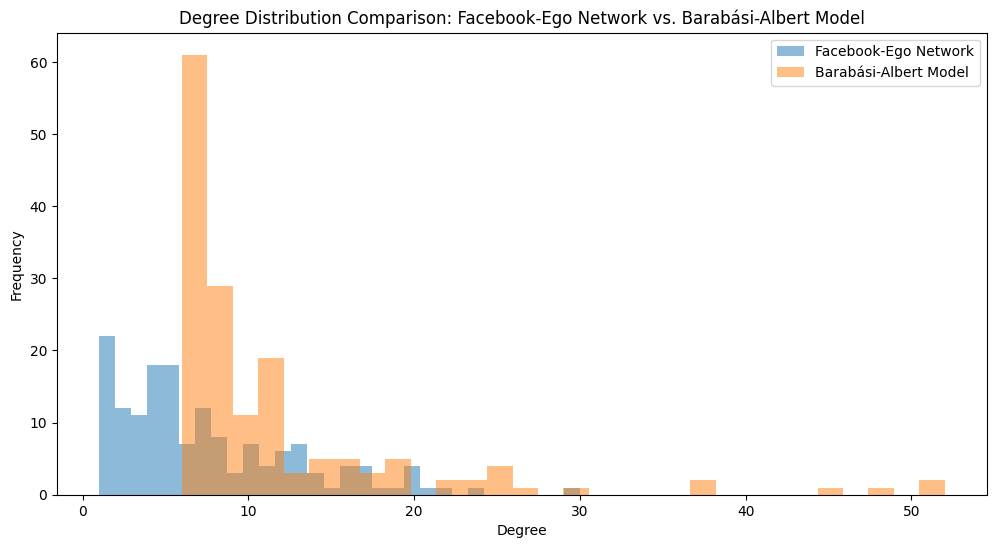

Average Clustering Coefficient of Facebook-Ego Network: 0.3947
Average Clustering Coefficient of Barabási-Albert Model: 0.1696

Average Path Length of Facebook-Ego Network: 4.0970
Average Path Length of Barabási-Albert Model: 2.2703



In [9]:
# Function to compare degree distributions
def compare_degree_distributions(G1, G2, title_G1, title_G2):
    degrees_G1 = [G1.degree(n) for n in G1.nodes()]
    degrees_G2 = [G2.degree(n) for n in G2.nodes()]
    
    # Plot histograms for comparison
    plt.figure(figsize=(12, 6))
    plt.hist(degrees_G1, bins=30, alpha=0.5, label=title_G1)
    plt.hist(degrees_G2, bins=30, alpha=0.5, label=title_G2)
    plt.xlabel('Degree')
    plt.ylabel('Frequency')
    plt.legend(loc='upper right')
    plt.title(f"Degree Distribution Comparison: {title_G1} vs. {title_G2}")
    plt.show()

# Function to compare clustering coefficients
def compare_clustering_coefficients(G1, G2, title_G1, title_G2):
    clustering_G1 = nx.average_clustering(G1)
    clustering_G2 = nx.average_clustering(G2)
    
    print(f"Average Clustering Coefficient of {title_G1}: {clustering_G1:.4f}")
    print(f"Average Clustering Coefficient of {title_G2}: {clustering_G2:.4f}")
    print()

# Function to compare average path lengths
def compare_average_path_lengths(G1, G2, title_G1, title_G2):
    if nx.is_connected(G1):
        avg_path_len_G1 = nx.average_shortest_path_length(G1)
    else:
        largest_component_G1 = max(nx.connected_components(G1), key=len)
        subgraph_G1 = G1.subgraph(largest_component_G1)
        avg_path_len_G1 = nx.average_shortest_path_length(subgraph_G1)

    if nx.is_connected(G2):
        avg_path_len_G2 = nx.average_shortest_path_length(G2)
    else:
        largest_component_G2 = max(nx.connected_components(G2), key=len)
        subgraph_G2 = G2.subgraph(largest_component_G2)
        avg_path_len_G2 = nx.average_shortest_path_length(subgraph_G2)
    
    print(f"Average Path Length of {title_G1}: {avg_path_len_G1:.4f}")
    print(f"Average Path Length of {title_G2}: {avg_path_len_G2:.4f}")
    print()

# Comparison with Watts-Strogatz model
watts_strogatz_graph = nx.watts_strogatz_graph(n=facebook_ego_graph.number_of_nodes(), k=6, p=0.1)
compare_degree_distributions(facebook_ego_graph, watts_strogatz_graph, "Facebook-Ego Network", "Watts-Strogatz Model")
compare_clustering_coefficients(facebook_ego_graph, watts_strogatz_graph, "Facebook-Ego Network", "Watts-Strogatz Model")
compare_average_path_lengths(facebook_ego_graph, watts_strogatz_graph, "Facebook-Ego Network", "Watts-Strogatz Model")

# Comparison with Chung-Lu model (Scale-Free)
chung_lu_graph = nx.expected_degree_graph([d for _, d in facebook_ego_graph.degree()], selfloops=False)
compare_degree_distributions(facebook_ego_graph, chung_lu_graph, "Facebook-Ego Network", "Chung-Lu Model")
compare_clustering_coefficients(facebook_ego_graph, chung_lu_graph, "Facebook-Ego Network", "Chung-Lu Model")
compare_average_path_lengths(facebook_ego_graph, chung_lu_graph, "Facebook-Ego Network", "Chung-Lu Model")

# Comparison with Barabási-Albert model
barabasi_albert_graph = nx.barabasi_albert_graph(n=facebook_ego_graph.number_of_nodes(), m=6)
compare_degree_distributions(facebook_ego_graph, barabasi_albert_graph, "Facebook-Ego Network", "Barabási-Albert Model")
compare_clustering_coefficients(facebook_ego_graph, barabasi_albert_graph, "Facebook-Ego Network", "Barabási-Albert Model")
compare_average_path_lengths(facebook_ego_graph, barabasi_albert_graph, "Facebook-Ego Network", "Barabási-Albert Model")

In [10]:
# Load Twitter-Ego Network
twitter_edges_file = 'datasets/2029971.edges'
twitter_ego_graph = nx.read_edgelist(twitter_edges_file, create_using=nx.DiGraph())

In [11]:
def compare_average_path_lengths(G1, G2, title_G1, title_G2):
    # Check if G1 is directed
    if G1.is_directed():
        # Use directed version for average path length calculation
        try:
            avg_path_len_G1 = nx.average_shortest_path_length(G1)
        except nx.NetworkXError:
            avg_path_len_G1 = None  # Handle if not all nodes are reachable

        # If you want to calculate for the undirected version
        avg_path_len_G1_undirected = nx.average_shortest_path_length(G1.to_undirected())

    else:
        if nx.is_connected(G1):
            avg_path_len_G1 = nx.average_shortest_path_length(G1)
        else:
            avg_path_len_G1 = None  # Handle disconnected graph

    # For G2, which is assumed to be undirected
    if nx.is_connected(G2):
        avg_path_len_G2 = nx.average_shortest_path_length(G2)
    else:
        avg_path_len_G2 = None  # Handle disconnected graph

    print(f"{title_G1} - Average Shortest Path Length: {avg_path_len_G1 if avg_path_len_G1 is not None else 'Not reachable'}")
    print(f"{title_G2} - Average Shortest Path Length: {avg_path_len_G2 if avg_path_len_G2 is not None else 'Not reachable'}")


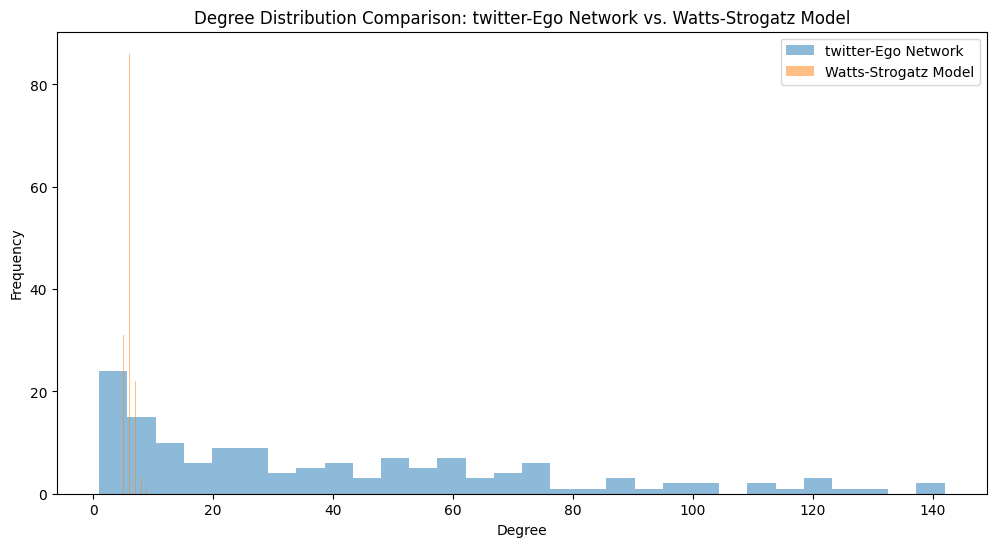

Average Clustering Coefficient of twitter-Ego Network: 0.4959
Average Clustering Coefficient of Watts-Strogatz Model: 0.4508

twitter-Ego Network - Average Shortest Path Length: Not reachable
Watts-Strogatz Model - Average Shortest Path Length: 3.977543583177386


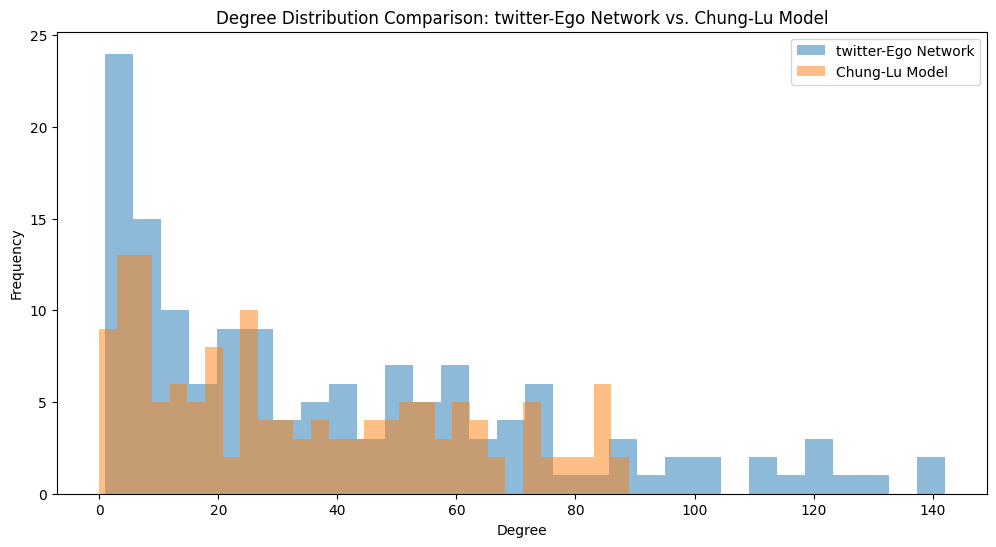

Average Clustering Coefficient of twitter-Ego Network: 0.4959
Average Clustering Coefficient of Chung-Lu Model: 0.5906

twitter-Ego Network - Average Shortest Path Length: Not reachable
Chung-Lu Model - Average Shortest Path Length: Not reachable


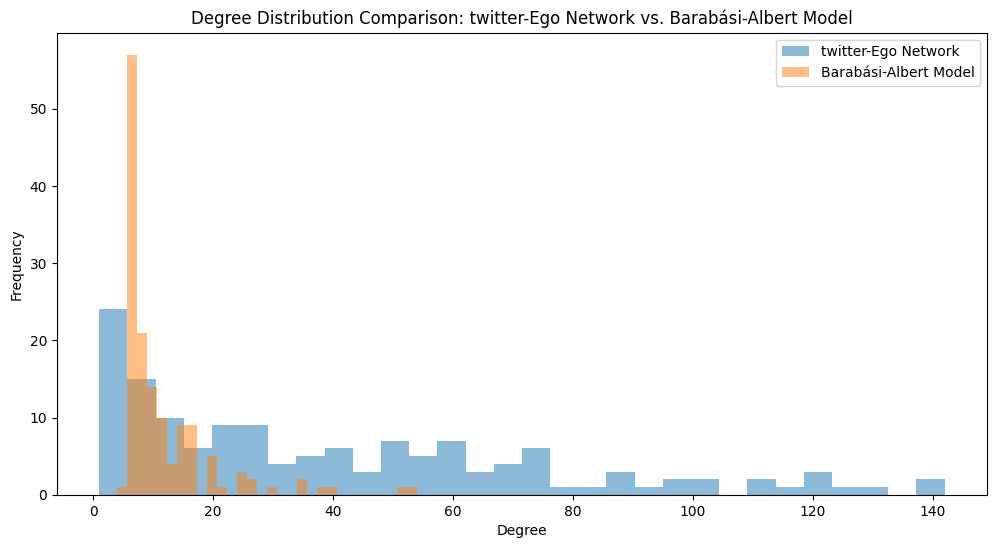

Average Clustering Coefficient of twitter-Ego Network: 0.4959
Average Clustering Coefficient of Barabási-Albert Model: 0.1780

twitter-Ego Network - Average Shortest Path Length: Not reachable
Barabási-Albert Model - Average Shortest Path Length: 2.2251551265635774


In [12]:
# Comparison with Watts-Strogatz model
watts_strogatz_graph = nx.watts_strogatz_graph(n=twitter_ego_graph.number_of_nodes(), k=6, p=0.1)
compare_degree_distributions(twitter_ego_graph, watts_strogatz_graph, "twitter-Ego Network", "Watts-Strogatz Model")
compare_clustering_coefficients(twitter_ego_graph, watts_strogatz_graph, "twitter-Ego Network", "Watts-Strogatz Model")
compare_average_path_lengths(twitter_ego_graph, watts_strogatz_graph, "twitter-Ego Network", "Watts-Strogatz Model")

# Comparison with Chung-Lu model (Scale-Free)
chung_lu_graph = nx.expected_degree_graph([d for _, d in twitter_ego_graph.degree()], selfloops=False)
compare_degree_distributions(twitter_ego_graph, chung_lu_graph, "twitter-Ego Network", "Chung-Lu Model")
compare_clustering_coefficients(twitter_ego_graph, chung_lu_graph, "twitter-Ego Network", "Chung-Lu Model")
compare_average_path_lengths(twitter_ego_graph, chung_lu_graph, "twitter-Ego Network", "Chung-Lu Model")

# Comparison with Barabási-Albert model
barabasi_albert_graph = nx.barabasi_albert_graph(n=twitter_ego_graph.number_of_nodes(), m=6)
compare_degree_distributions(twitter_ego_graph, barabasi_albert_graph, "twitter-Ego Network", "Barabási-Albert Model")
compare_clustering_coefficients(twitter_ego_graph, barabasi_albert_graph, "twitter-Ego Network", "Barabási-Albert Model")
compare_average_path_lengths(twitter_ego_graph, barabasi_albert_graph, "twitter-Ego Network", "Barabási-Albert Model")

Among the three random graph models, the Chung-Lu model most closely approximates the degree distribution of the Facebook-Ego network. However, none of the models perfectly match all the properties of the Facebook-Ego network. Each model captures different aspects:

* Watts-Strogatz approximates the average path length well but struggles with the degree distribution.
* Chung-Lu captures the degree distribution well but fails in terms of clustering and path length.
* Barabási-Albert captures the scale-free degree distribution but fails in clustering and path length.

Thus, if prioritizing the degree distribution, the Chung-Lu model is the best approximation, though it misses on clustering and path length.